# Handling the IPCC database: reference

**Content of the reference**

* [Basics of IAMC database and the **`DataVar`** variable](#basics)
* [**Reference A: Selecting data**](#ref-A)
    1. [Basic variable selection](#selection-1)
    2. [Specific year and adding a metadata column](#selection-2)
    3. [Multiple years, filtering on metadata column](#selection-3)
    4. [Calculations with datavars](#selection-4)
    5. [Calculations with different variables and joining multiple metadata colum](#selection-5)
    6. [Calculations and selection of metadata columns only](#selection-6)
* [**Reference B: Plotting data**](#ref-B)
    1. [Basic line plot of variable over time](#plot-1)
    2. [Line plot with colors by metadata column](#plot-2)
    3. [Funnel plot (continuous error bars)](#plot-3)
    4. [Scatter plot multiple variables with facets](#plot-4)
    5. [Scatter plot with trendline](#plot-5)
    6. [Combine different plots](#plot-6)
* [**Reference C: Changing the layout of a plot**](#ref-C)
    1. [Change figure size](#layout-1)
    2. [Add title](#layout-2)
    3. [Update axes (title, tickformat, ticksuffix)](#layout-3)
    4. [Style of line traces](#layout-4)
    5. [Style of scatter traces](#layout-5)
    6. [Exporting figures](#layout-6)
* [**Reference D: Regional data**](#ref-D)
    1. [Plotting regional data using a scatter plot](#regional-1)
    2. [Plotting on a map (choropleth)](#regional-2)

### Import packages

In [1]:
from ar6_utils.importdata import import_data
from ar6_utils.datavar import DataVar
from ar6_utils.plot import CATEGORIES_COLORS, IPCC_COLORS, MACROREGIONS_GEO, line_continuous_error_bars

import numpy as np
import pandas as pd
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pio.templates.default = "ipcc"
pio.renderers.default = "plotly_mimetype+notebook"

<a id="basics"></a>
## Basics of IAMC database: data and metadata
(todo: wat zijn de variabelen, de scenarios, wat staat er in de columns, metadata, link metadata vs database)

Overzicht van hoe je van grote bak data iets kunt doen:
- Verschillende modelleer teams, die maken verschillende scenarios, met verschillende aannames
- Grote bak met 3000 scenarios, maar dan eerst vetting. (visualiseren: 10 scenarios erin, 5 eruit)
- Climate vetting voor scenarios waar je leuke dingen mee kunt (temperatuur)
(referentie vettingpaper)

Regionaal? Emissies en energy use per capita, 

### 1. The data-file:
<img src="img/data_overview.png" alt="" width="800"/>

### 2. The metadata-file:
<img src="img/meta_overview.png" alt="" width="780"/>

### 3. Working with the `datavar` object:

The database and the metadata are simple "dataframes", which you can use directly to start your analysis. However, it is much more convenient to use the `datavar` object: it allows you to easily perform calculations between variables, select scenarios matching certain criteria, and combining it directly with metadata.

There are two steps to use the `datavar` object:
1. Choose a variable you are interested in (optionally combined with a certain year or region). All calculations should be performed in the first step (adding certain variables, dividing all years by a single reference year, etc.).
2. Select which scenarios you want to have the values for. The selection is always based on the metadata columns. This step can be used to add metadata columns, by saying that all values of that metadata column need to be selected.

<img src="img/datavar.png" alt="" width="600"/>

In [2]:
folder = '../../Databases/snapshots/snapshot_ar6_public_1.0/'
data_filename = 'AR6_Scenarios_Database_World_v1.0.csv'
meta_filename = 'AR6_Scenarios_Database_metadata_indicators_v1.0.xlsx'

data, meta_raw = import_data(folder, data_filename, meta_filename, extra=False)
meta = meta_raw[(meta_raw["Vetting_historical"] == "PASS") & (~meta_raw["Category"].isna())] # Only keep vetted scenarios

# Create DataVar object
datavar = DataVar(data, meta)

Importing data...
Converting to standard units...
Creating metadata...
   Importing vetting...
Finished.


<a id="ref-A"></a>

# Reference A: selecting data

<a id="selection-1"></a>
### Selection 1: basic variable selection

Select a variable, all years and no extra metadata columns:

In [3]:
datavar("Emissions|CO2").select()

,Name,Year,Value
0,AIM/CGE 2.0 SSP1-26,2010,35.781814
1,AIM/CGE 2.0 SSP1-26,2015,36.481576
2,AIM/CGE 2.0 SSP1-26,2020,37.181338
3,AIM/CGE 2.0 SSP1-26,2025,33.485924
4,AIM/CGE 2.0 SSP1-26,2030,29.790509
...,...,...,...
22792,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,2080,81.678209
22793,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,2085,82.927784
22794,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,2090,84.177359
22795,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,2095,82.322658


<a id="selection-2"></a>
### Selection 2: specific year and adding a metadata column

We now only select values in the year 2050, and add the metadata column "Category".

By specifying "all", all values are selected (no additional filtering is performed, only the metadata column is added).

In [4]:
datavar("Emissions|CO2", 2050).select({"Category": "all"})

,Category,Name,Value
0,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2.737839
1,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP1-1p5C-minCDR,3.175846
2,C1,IMAGE 3.2 SSP1_SPA1_19I_D_LB,-0.732287
3,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP2-1p5C-fullCDR,0.879238
4,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP2-1p5C-minCDR,4.770185
...,...,...,...
1197,C8,REMIND-MAgPIE 1.7-3.0 EMF33_Baseline,64.417105
1198,C8,REMIND 2.1 R2p1_SSP5-Base,84.270954
1199,C8,IMAGE 3.2 SSP5-baseline,85.025051
1200,C8,WITCH 4.6 DISCRATE_Ref_dr5p,66.286363


<a id="selection-3"></a>
### Selection 3: Multiple years, filtering on metadata column

Select two years and only select those values with category C1 or C2.

Note that the columns `Year` and `Category` are now added to the output.

In [5]:
datavar("Emissions|CO2", [2030, 2100]).select({"Category": ["C1", "C2"]})

,Category,Name,Year,Value
0,C1,AIM/CGE 2.1 CD-LINKS_NPi2020_400,2030,21.604870
1,C1,AIM/CGE 2.1 CD-LINKS_NPi2020_400,2100,-6.818765
2,C1,REMIND 2.1 R2p1_SSP5-PkBudg900,2030,25.472570
3,C1,REMIND 2.1 R2p1_SSP5-PkBudg900,2100,-12.099108
4,C1,REMIND 2.1 R2p1_SSP2-PkBudg900,2030,23.810687
...,...,...,...,...
455,C2,POLES ENGAGE EN_NPi2020_300f,2100,-15.177494
456,C2,MESSAGEix-GLOBIOM_GEI 1.0 SSP2_openres_lc_100,2030,29.414185
457,C2,MESSAGEix-GLOBIOM_GEI 1.0 SSP2_openres_lc_100,2100,-17.326515
458,C2,MESSAGEix-GLOBIOM_GEI 1.0 SSP2_openres_lc_CB400,2030,25.479194


<a id="selection-4"></a>
### Selection 4: Calculations with datavars

Perform calculations with the datavars. Any combination of variables/years can be used.

All basic arithmetic operations can be performed with datavar objects.

Note that the calculations should always happen BEFORE the `.select()` step.

In this example, the CO2 emissions are calculated relative to 2019.

In [6]:
(
    datavar("Emissions|CO2") / datavar("Emissions|CO2", 2019)
).select()

,Name,Year,Value
0,AIM/CGE 2.0 SSP1-26,2010,0.965996
1,AIM/CGE 2.0 SSP1-26,2015,0.984887
2,AIM/CGE 2.0 SSP1-26,2020,1.003778
3,AIM/CGE 2.0 SSP1-26,2025,0.904014
4,AIM/CGE 2.0 SSP1-26,2030,0.804249
...,...,...,...
22792,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,2080,1.958800
22793,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,2085,1.988767
22794,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,2090,2.018735
22795,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,2095,1.974255


<a id="selection-5"></a>
### Selection 5: Calculations with different variables and joining multiple metadata columns

Different variables can also be used in calculations. And more meta columns can be used.

In [7]:
(
    datavar("Primary Energy|Wind") + datavar("Primary Energy|Solar")
).select({
    "Category": ["C1", "C2"],
    "Year of peak GHG Emissions": "all",
    "Cumulative net CO2 (2020-2100, Gt CO2) (Harm-Infilled)": "all",
})

,Category,Year of peak GHG Emissions,"Cumulative net CO2 (2020-2100, Gt CO2) (Harm-Infilled)",Name,Year,Value
0,C1,2015.0,-316.756374,MESSAGE-GLOBIOM 1.0 EMF33_1.5C_full,2010,4.182713
1,C1,2015.0,-316.756374,MESSAGE-GLOBIOM 1.0 EMF33_1.5C_full,2015,11.409575
2,C1,2015.0,-316.756374,MESSAGE-GLOBIOM 1.0 EMF33_1.5C_full,2020,18.636437
3,C1,2015.0,-316.756374,MESSAGE-GLOBIOM 1.0 EMF33_1.5C_full,2025,35.580142
4,C1,2015.0,-316.756374,MESSAGE-GLOBIOM 1.0 EMF33_1.5C_full,2030,52.523846
...,...,...,...,...,...,...
3365,C2,2025.0,547.363058,REMIND-MAgPIE 2.1-4.2 EN_INDCi2030_600f_NDCp,2080,578.611000
3366,C2,2025.0,547.363058,REMIND-MAgPIE 2.1-4.2 EN_INDCi2030_600f_NDCp,2085,655.113850
3367,C2,2025.0,547.363058,REMIND-MAgPIE 2.1-4.2 EN_INDCi2030_600f_NDCp,2090,731.616700
3368,C2,2025.0,547.363058,REMIND-MAgPIE 2.1-4.2 EN_INDCi2030_600f_NDCp,2095,808.748550


<a id="selection-6"></a>
### Selection 6: Calculations and selection of metadata columns only

Until now, the `datavar` object was only used to get *variable data* and to perform calculations with those. The `.select(...)` command was used to join metadata columns to that variable data, and potentially do some filtering. However, it often happens that you only want to get *metadata*, without any variable (for example, when you want to plot cumulative emissions as function of net-zero year). This is possible using `datavar(meta=...)`:

In [8]:
selection6 = datavar(
    meta=[
        "Cumulative net CO2 (2020-2100, Gt CO2) (Harm-Infilled)",
        "Year of netzero CO2 emissions (Harm-Infilled) table",
    ]
).select({"Category": "all"})
selection6.head()

,Category,Name,"Cumulative net CO2 (2020-2100, Gt CO2) (Harm-Infilled)",Year of netzero CO2 emissions (Harm-Infilled) table
0,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,-110.696287,2052.0
1,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP1-1p5C-minCDR,513.769205,2068.0
2,C1,IMAGE 3.2 SSP1_SPA1_19I_D_LB,308.957896,2049.0
3,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP2-1p5C-fullCDR,431.417534,2052.0
4,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP2-1p5C-minCDR,520.569379,2069.0


Note that we now still join the `Category` column in the `.select({"Category": "all"})`. The same could be achieved by simply adding `Category` to the list of metadata columns in `datavar`. The only difference is that the dataframe is not sorted anymore by category.

In [9]:
selection6b = datavar(
    meta=[
        "Cumulative net CO2 (2020-2100, Gt CO2) (Harm-Infilled)",
        "Year of netzero CO2 emissions (Harm-Infilled) table",
        "Category",
    ]
).select()
selection6b.head()

,Name,"Cumulative net CO2 (2020-2100, Gt CO2) (Harm-Infilled)",Year of netzero CO2 emissions (Harm-Infilled) table,Category
0,AIM/CGE 2.0 SSP1-26,942.485543,2090.0,C3
1,AIM/CGE 2.0 SSP1-34,1774.370588,NaN,C5
2,AIM/CGE 2.0 SSP1-45,2473.615376,NaN,C6
3,AIM/CGE 2.0 SSP1-Baseline,2994.686677,NaN,C7
4,AIM/CGE 2.0 SSP4-26,926.934351,2077.0,C3


<a id="ref-B"></a>
# Reference B: plotting data

<a id="plot-1"></a>
### Plot 1: basic line plot of variable over time

In [3]:
selection1 = datavar("Emissions|CO2").select()
selection1.head()

,Name,Year,Value
0,AIM/CGE 2.0 SSP1-26,2010,35.781814
1,AIM/CGE 2.0 SSP1-26,2015,36.481576
2,AIM/CGE 2.0 SSP1-26,2020,37.181338
3,AIM/CGE 2.0 SSP1-26,2025,33.485924
4,AIM/CGE 2.0 SSP1-26,2030,29.790509


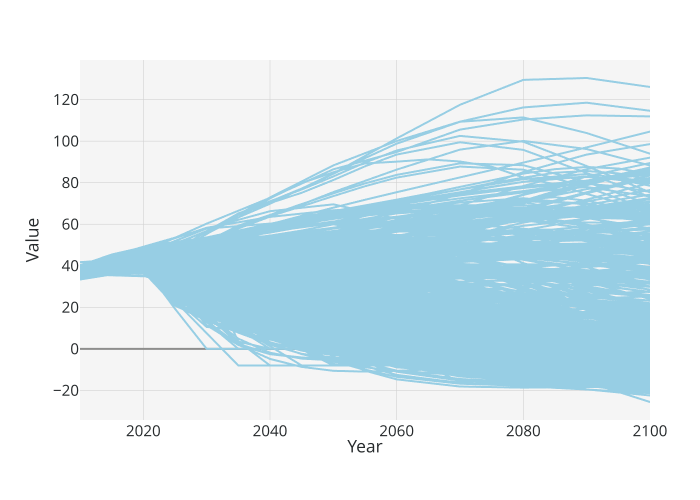

In [4]:
fig1 = px.line(
    selection1,
    x="Year",
    y="Value",
    line_group="Name", # This is necessary to know which points belong on one line. In this case, all the points with the same "Name" column values.
)
## Note: all keywords here (`Year``, `Values`, `Name`) correspond to columns in `selection1`

fig1.show(renderer='svg') # NOTE: remove `renderer='svg'` to make the figure interactive

<a id="plot-2"></a>
### Plot 2: line plot with colors by metadata column

In [5]:
selection2 = datavar("Emissions|CO2").select({"Category": "all"})
selection2.head()

,Category,Name,Year,Value
0,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2010,38.542018
1,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2015,39.078620
2,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2020,39.615223
3,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2025,31.719723
4,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2030,23.824223


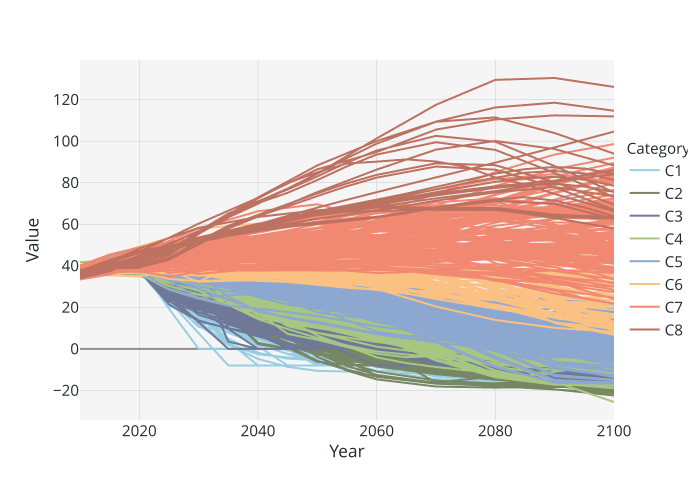

In [6]:
fig2 = px.line(
    selection2,
    x="Year",
    y="Value",
    line_group="Name",
    color="Category",
)
fig2.show(renderer='svg') # NOTE: remove `renderer='svg'` to make the figure interactive

<a id="plot-3"></a>
### Plot 3: funnel plot (continuous error bars)

This is not a standard feature of Plotly. Therefore, use the function `line_continuous_error_bars` from `ar6_utils.plot`. It uses the exact same syntax as the default `px.line` from Plotly Express, but needs an extra argument `groupby_columns`: a list of columns in the selection that should be grouped together. Typically, this would be `Year` and `Category` (or another metadata column).

Default quantiles are 0.05 and 0.95, which can be changed using `q_low` and `q_high` arguments.

In [7]:
selection3 = datavar("Emissions|CO2").select({"Category": "all"})
selection3.head()

,Category,Name,Year,Value
0,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2010,38.542018
1,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2015,39.078620
2,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2020,39.615223
3,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2025,31.719723
4,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2030,23.824223


In [8]:
fig3 = line_continuous_error_bars(
    selection3,
    ["Year", "Category"], # these are the groupby_columns,
    x="Year",
    y="Value",
    color="Category",
)
fig3.show()

<a id="plot-4"></a>
### Plot 4: Scatter plot multiple variables with facets

In [9]:
selection4 = datavar(
    meta=[
        "Year of netzero CO2 emissions (Harm-Infilled) table",
        "Year of netzero GHG emissions (Harm-Infilled) table",
        "Cumulative net CO2 (2020 to netzero, Gt CO2) (Harm-Infilled)"
    ]
).select({"Category": ["C1", "C2", "C3", "C4", "C5"]})

selection4.head()

,Category,Name,Year of netzero CO2 emissions (Harm-Infilled) table,Year of netzero GHG emissions (Harm-Infilled) table,"Cumulative net CO2 (2020 to netzero, Gt CO2) (Harm-Infilled)"
0,C1,WITCH-GLOBIOM 4.4 CD-LINKS_NPi2020_400,2055.0,2069.0,473.416283
1,C1,GCAM 5.3 R_MAC_50_n8,2045.0,inf,512.002256
2,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP2-1p5C-minCDR,2069.0,inf,528.644620
3,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP2-1p5C-fullCDR,2052.0,inf,539.559537
4,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP1-1p5C-minCDR,2068.0,inf,537.313335


In [10]:
fig4 = px.scatter(
    selection4,
    x="Cumulative net CO2 (2020 to netzero, Gt CO2) (Harm-Infilled)",
    y=[
        "Year of netzero CO2 emissions (Harm-Infilled) table",
        "Year of netzero GHG emissions (Harm-Infilled) table",
    ],
    color="Category",
    facet_col="variable",
)
fig4.show()

<a id="plot-5"></a>
### Plot 5: Scatter plot with trendline

When creating a scatter plot, you can easily add a linear fit (trendline) to the data. By default this happens for each trace (for each color group). To create a global trendline, add the argument `trendline_scope="overall"`.

In the plot, hover over the trendline to get the equation of the trendline.

In [11]:
selection5 = datavar(
    meta=[
        "Year of netzero CO2 emissions (Harm-Infilled) table",
        "Median warming in 2100 (FaIRv1.6.2)",
    ]
).select({"Category": "all"})
selection5.head()

,Category,Name,Year of netzero CO2 emissions (Harm-Infilled) table,Median warming in 2100 (FaIRv1.6.2)
0,C1,MESSAGEix-GLOBIOM 1.0 CD-LINKS_NPi2020_400,2052.0,1.095274
1,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP1-1p5C-minCDR,2068.0,1.274399
2,C1,IMAGE 3.2 SSP1_SPA1_19I_D_LB,2049.0,1.276742
3,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP2-1p5C-fullCDR,2052.0,1.383032
4,C1,REMIND-MAgPIE 2.1-4.2 CEMICS_SSP2-1p5C-minCDR,2069.0,1.415305


In [19]:
fig5 = px.scatter(
    selection5,
    x="Year of netzero CO2 emissions (Harm-Infilled) table",
    y="Median warming in 2100 (FaIRv1.6.2)",
    color="Category",
    trendline="ols",
    trendline_scope="overall", # Remove this line to create trendline by category
)
fig5.show()

<a id="plot-6"></a>
### Plot 6: Combine different plots

It is possible to combine different plots: for example, a funnel graph and a line plot for specific scenarios, or a scatter plot of all scenarios combined with a scatter plot of Illustrative Mitigation Pathways.

To combine them, first make the figures separately. Then, create a new empty figure which uses the traces (data) of both figures.

In [20]:
fig1 = line_continuous_error_bars(
    datavar("Emissions|CO2").select({"Category": "all"}),
    ["Year", "Category"],
    x="Year",
    y="Value",
    color="Category",
    with_median=False,
)

fig2 = px.line(
    datavar("Emissions|CO2").select({"IMP_marker": "all"}),
    x="Year",
    y="Value",
    color="IMP_marker",
    color_discrete_sequence=IPCC_COLORS,
)

fig_combined = go.Figure(data=fig1.data + fig2.data, layout=fig1.layout)
fig_combined

<a id="ref-C"></a>
# Reference C: changing the layout of a plot

This section contains some sample code on how to change the layout of a Plotly figure. A full reference is available here: [https://plotly.com/python/reference/layout/](https://plotly.com/python/reference/layout/).

In Plotly, the layout (styling) of a figure is changed after creating the figure. The layout is changed by calling the function `.update_layout()` on the figure:
```
fig = px.scatter(...)   # Create the figure
fig.update_layout(      # Update the layout
    ...
)
```

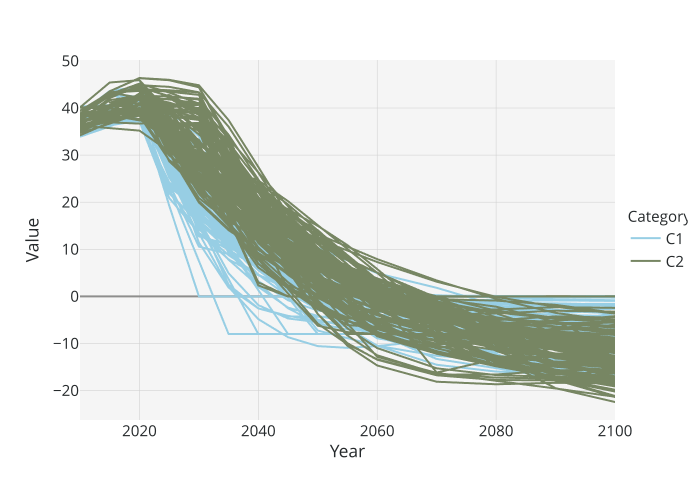

In [12]:
# Example figure:
fig = px.line(
    datavar("Emissions|CO2").select({"Category": ["C1", "C2"]}),
    x="Year",
    y="Value",
    color="Category",
    line_group="Name",
)
fig.show(renderer='svg') # NOTE: remove `renderer='svg'` to make the figure interactive

<a id="layout-1"></a>
### Layout 1: Change figure size

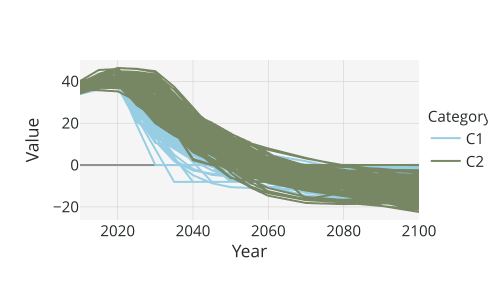

In [13]:
fig.update_layout(
    width=500,
    height=300,
)

fig.show(renderer='svg') # NOTE: remove `renderer='svg'` to make the figure interactive

<a id="layout-2"></a>
### Layout 2: Add title

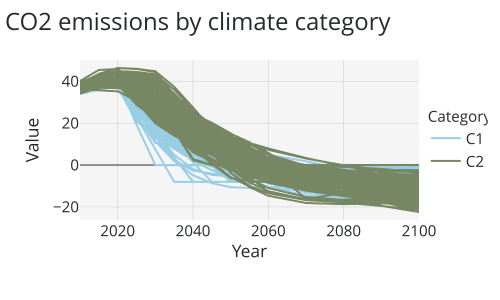

In [14]:
fig.update_layout(
    title="CO2 emissions by climate category"
)

fig.show(renderer='svg') # NOTE: remove `renderer='svg'` to make the figure interactive

<a id="layout-3"></a>
### Layout 3: Update axes

Instead of updating the general layout of the figure using `fig.update_layout(...)`, the axes can be updated using `fig.update_xaxes(...)` and `fig.update_yaxes(...)`. The full documentation about this can be found at
* [https://plotly.com/python/axes/](https://plotly.com/python/axes/)
* [https://plotly.com/python/reference/layout/xaxis/](https://plotly.com/python/reference/layout/xaxis/)
* [https://plotly.com/python/reference/layout/yaxis/](https://plotly.com/python/reference/layout/yaxis/)

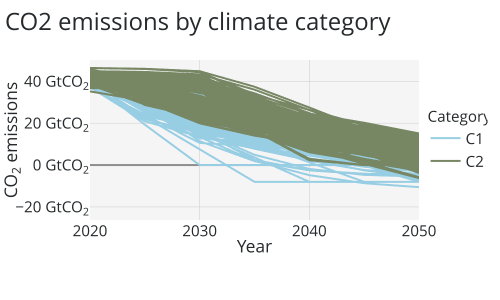

In [15]:
fig.update_xaxes(
    range=[2020, 2050]
)

fig.update_yaxes(
    title="CO<sub>2</sub> emissions", # Note that HTML commands like <sub>2</sub> can be used for subscript font.
    ticksuffix=" GtCO<sub>2</sub>",
)

fig.show(renderer='svg') # NOTE: remove `renderer='svg'` to make the figure interactive


<a id="layout-4"></a>
### Layout 4: Style of line traces

Just like the general layout (`fig.update_layout(...)`) and axes (`fig.update_xaxes(...)`), the traces (the data itself) can be styled using `fig.update_traces(...)`.

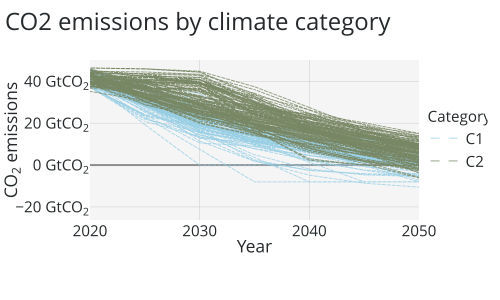

In [16]:
fig.update_traces(
    line={
        'width': 1,
        'dash': 'dash',
    },
    opacity=0.75,
)

fig.show(renderer='svg') # NOTE: remove `renderer='svg'` to make the figure interactive

<a id="layout-5"></a>
### Layout 5: Styling of scatter traces

A scatter plot can also be styled using `fig.update_traces(...)` but using `marker=...`. In this example we start with the example from [Plot 4](#plot-4).



In [26]:
# First we update only the left column using `col=1`:
fig4.update_traces(
    col=1,
    marker={
        "size": 4,
        "symbol": "star",
    },
)

# Then we update the right column using `col=2`:
fig4.update_traces(
    col=2,
    marker={
        "symbol": "diamond",
        "size": 10
    }
)


<a id="layout-6"></a>
### Layout 6: Exporting figures

After having created and styled a figure, you can export it to various formats: png, svg, pdf and more. The advantage of svg is that you can edit the exported SVG figure in programs like Inkscape or Adobe Illustrator to further style the figure.


In [27]:
fig.write_image("yourfilename.png")
fig.write_image("yourfilename.svg")
fig.write_image("yourfilename.pdf")

<a id="ref-D"></a>
# Reference D: regional data

By default, when importing the data you only import the global data file and the metadata file. However, the metadata can also be combined with a regional version of the IPCC AR6 database. Here, we use the R5 regions, but the data is also available on the IIASA website on different resolutions. The `DataVar` object is also able to work with regional data: it simply adds an extra column `Region`. Import it using:

In [28]:
data_regional_filename = 'AR6_Scenarios_Database_R5_regions_v1.0.csv'

# Don't forget the argument `only_world=False`
data_regional, _ = import_data(folder, data_regional_filename, meta_filename, extra=False, onlyworld=False)

# Create DataVar object. Don't foget the argument `is_regional=True`
datavar_regional = DataVar(data_regional, meta, is_regional=True)

Importing data...
Converting to standard units...
Creating metadata...
   Importing vetting...
Finished.


<a id="regional-1"></a>
### Regional 1: Plotting regional data using a scatter plot

In [29]:
selection_regional = datavar_regional(["Emissions|CO2", "Emissions|CH4"], 2100).select()
selection_regional

,Name,Region,Variable,Value
0,AIM/CGE 2.0 SSP1-26,R5ASIA,Emissions|CH4,32.958800
1,AIM/CGE 2.0 SSP1-26,R5ASIA,Emissions|CO2,-0.108355
2,AIM/CGE 2.0 SSP1-26,R5LAM,Emissions|CH4,14.563300
3,AIM/CGE 2.0 SSP1-26,R5LAM,Emissions|CO2,-0.543469
4,AIM/CGE 2.0 SSP1-26,R5MAF,Emissions|CH4,39.010000
...,...,...,...,...
11919,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,R5MAF,Emissions|CO2,14.810541
11920,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,R5OECD90+EU,Emissions|CH4,45.626720
11921,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,R5OECD90+EU,Emissions|CO2,12.973879
11922,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,R5REF,Emissions|CH4,57.687099


In [30]:
# To plot CH4 emissions as function of CO2 emissions,
# we need a column CO2 and a column CH4, instead of a column Variable and a column Value.
# We call this going from long format to wide format.
selection_regional_wide = (
    selection_regional
    .set_index(["Name", "Region", "Variable"])  # Create an index of all columns except Value
    ["Value"]                                   # Select the only remaining column Value
    .unstack("Variable")                        # Unstack the variable we want to make wide
    .reset_index()                              # Go back to normal dataframe
)
selection_regional_wide

Variable,Name,Region,Emissions|CH4,Emissions|CO2
0,AIM/CGE 2.0 SSP1-26,R5ASIA,32.958800,-0.108355
1,AIM/CGE 2.0 SSP1-26,R5LAM,14.563300,-0.543469
2,AIM/CGE 2.0 SSP1-26,R5MAF,39.010000,-0.052376
3,AIM/CGE 2.0 SSP1-26,R5OECD90+EU,22.528100,0.544884
4,AIM/CGE 2.0 SSP1-26,R5REF,3.632400,-0.192054
...,...,...,...,...
5957,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,R5ASIA,131.380225,33.816931
5958,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,R5LAM,57.546215,6.469990
5959,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,R5MAF,83.388491,14.810541
5960,WITCH-GLOBIOM 4.4 CD-LINKS_NoPolicy,R5OECD90+EU,45.626720,12.973879


In [31]:
fig = px.scatter(
    selection_regional_wide,
    x="Emissions|CO2",
    y="Emissions|CH4",
    color="Region",
    hover_name="Name",
)
fig

<a id="regional-2"></a>
### Regional 2: Plotting on a map (choropleth)

A nice visual way of plotting regional data is on a map. This is called a choropleth plot. However, a map can only display one-dimensional data: one value per region. We can either select one single scenario for this, or we can aggregate all scenarios in a selection using the following aggregations:
* `mean()`
* `median()`
* `quantile(0.05)` (or any other quantile)

To achieve this we need to group the selection by all relevant variables (Region and possibly Year and/or Variable, and all metadata columns like Category if you included it in `.select()`):

In [32]:
selection = datavar_regional("Emissions|CO2", [2020, 2050, 2100]).select({"Category": ["C1", "C3", "C7"]})
selection_grouped = selection.groupby(["Region", "Year", "Category"]).median().reset_index()
selection_grouped.head()

,Region,Year,Category,Value
0,R5ASIA,2020,C1,17.393373
1,R5ASIA,2020,C3,17.090441
2,R5ASIA,2020,C7,18.239535
3,R5ASIA,2050,C1,1.260943
4,R5ASIA,2050,C3,5.077181


In [33]:
fig_choropleth = px.choropleth(
    selection_grouped,
    locations="Region",
    geojson=MACROREGIONS_GEO,   # Regional definitions are given in this variable
    color="Value",
    facet_col="Year",           # Ignore if you don't have different years
    facet_row="Category",       # Ignore if you don't differentiate by category
    projection="natural earth",
    labels={"Value": "CO<sub>2</sub> emissions"}, # Not necessary, it just gives the colorbar a nice title
)
fig_choropleth.update_layout(height=600)